# User Experience Analytics
we delve into the realm of user experience analysis within the telecommunications industry. Focusing on <br> network parameters such as:
- TCP retransmission
- Round Trip Time (RTT)
- throughput
- handset types

we aim to gain insights into the users' perceptions and optimize services accordingly.

### Import Packages

In [1]:
import pickle
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, normalize
import numpy as np
import sys, os
import pandas as pd

In [2]:
sys.path.append(os.path.abspath(os.path.join('../src')))

In [3]:

from data_loader import load_data
from data_cleaning_utils import DataCleaningUtil
from plot_utils import PlotUtil
from utils import get_distortions_and_inertias

cleaning_utils = DataCleaningUtil()
plot_utls = PlotUtil()

### Load the dataset

In [4]:
# Connection parameters
connection_params = {
    "host": "localhost",
    "user": "birehan",
    "password": "password",
    "port": "5432",
    "database": "tellco_db"  # Change to your desired database name
}
table_name = "public.xdr_data"
file_path = "../data/tellco_data.csv"

df = load_data(connection_params, table_name, file_path)
print(df.head())

2023-12-14 17:53:35,760:logger:Successfully fetched data from the database.
2023-12-14 17:53:35,783:logger:Database connection closed.


           ("Bearer Id"          "Start" "Start ms"            "End" "End ms"  \
0  1.31144834608449e+19   4/4/2019 12:01        770  4/25/2019 14:35      662   
1  1.31144834828789e+19   4/9/2019 13:04        235   4/25/2019 8:15      606   
2  1.31144834840805e+19   4/9/2019 17:42          1  4/25/2019 11:58      652   
3  1.31144834854428e+19   4/10/2019 0:31        486   4/25/2019 7:36      171   
4  1.31144834994807e+19  4/12/2019 20:10        565  4/25/2019 10:40      954   

  "Dur. (ms)"           "IMSI" "MSISDN/Number"          "IMEI"  \
0     1823652  208201448079117     33664962239  35521209507511   
1     1365104  208201909211140     33681854413  35794009006359   
2     1361762  208200314458056     33760627129  35281510359387   
3     1321509  208201402342131     33750343200  35356610164913   
4     1089009  208201401415120     33699795932  35407009745539   

    "Last Location Name"  ... "Youtube DL (Bytes)" "Youtube UL (Bytes)"  \
0  9.16456699548519E+015  ...           1

### Pre processing the required fields

In [5]:
numeric_columns = [ 
        '"MSISDN/Number"', '"Avg RTT DL (ms)"', '"Avg RTT UL (ms)"',
        '"Avg Bearer TP DL (kbps)"', '"Avg Bearer TP UL (kbps)"',
        '"TCP DL Retrans. Vol (Bytes)"', '"TCP UL Retrans. Vol (Bytes)"']

string_columns = ['"Handset Type"']

df = cleaning_utils.change_datatype_to_float(df, numeric_columns)
df = cleaning_utils.change_datatype_to_string(df, string_columns)

2023-12-14 17:53:41,186:logger:Change columns ['"MSISDN/Number"', '"Avg RTT DL (ms)"', '"Avg RTT UL (ms)"', '"Avg Bearer TP DL (kbps)"', '"Avg Bearer TP UL (kbps)"', '"TCP DL Retrans. Vol (Bytes)"', '"TCP UL Retrans. Vol (Bytes)"'] datatype to numeric
2023-12-14 17:53:41,583:logger:change columns ['"Handset Type"'] datatype to string


In [7]:

df = df.rename(columns={ '"Handset Type"': 'handset_type', '"MSISDN/Number"': 'msisdn_number'})

df['total_avg_bearer_tp_kbps'] = df['"Avg Bearer TP DL (kbps)"'] + df['"Avg Bearer TP UL (kbps)"']
df['total_tcp_dl_retrans_vol_bytes'] = df['"TCP DL Retrans. Vol (Bytes)"'] + df['"TCP UL Retrans. Vol (Bytes)"']
df['total_avg_rtt_dl_ms'] = df['"Avg RTT DL (ms)"'] + df['"Avg RTT DL (ms)"']


# Selecting only the desired columns
exp_df = df[['handset_type', 'msisdn_number', 'total_avg_bearer_tp_kbps', 'total_tcp_dl_retrans_vol_bytes', 'total_avg_rtt_dl_ms']].copy()

exp_df.columns

Index(['handset_type', 'msisdn_number', 'total_avg_bearer_tp_kbps',
       'total_tcp_dl_retrans_vol_bytes', 'total_avg_rtt_dl_ms'],
      dtype='object')

In [8]:
exp_df.head()

,handset_type,msisdn_number,total_avg_bearer_tp_kbps,total_tcp_dl_retrans_vol_bytes,total_avg_rtt_dl_ms
0,Samsung Galaxy A5 Sm-A520F,3.366496e+10,67.0,NaN,84.0
1,Samsung Galaxy J5 (Sm-J530),3.368185e+10,42.0,NaN,130.0
2,Samsung Galaxy A8 (2018),3.376063e+10,15.0,NaN,NaN
3,undefined,3.375034e+10,88.0,NaN,NaN
4,Samsung Sm-G390F,3.369980e+10,15.0,NaN,NaN


#### Handle Missing Values

In [9]:
cleaning_utils.get_missing_values_percent(exp_df)

2023-12-14 17:53:46,477:logger:Get missing values percentage from dataframe


,missing_percent
handset_type,0.002667
total_avg_bearer_tp_kbps,0.003333
msisdn_number,0.713310
total_avg_rtt_dl_ms,18.554715
total_tcp_dl_retrans_vol_bytes,66.353788


In [10]:
exp_df = cleaning_utils.fill_unknown_missing_values(exp_df, ["handset_type"])
exp_df = cleaning_utils.fill_mean_missing_values(exp_df, ["total_avg_bearer_tp_kbps"])
exp_df['msisdn_number'].fillna(np.random.randint(1000000000, 9999999999), inplace=True)
exp_df = cleaning_utils.forward_fill_missing_values(exp_df, ["total_avg_rtt_dl_ms", "total_tcp_dl_retrans_vol_bytes"])
exp_df.dropna(subset=["total_tcp_dl_retrans_vol_bytes"], inplace=True)

2023-12-14 17:53:48,127:logger:filel string type missing values with unknown


2023-12-14 17:53:48,136:logger:fill missing values with mean
2023-12-14 17:53:48,153:logger:forward fill missing values


In [12]:
exp_df.columns

Index(['handset_type', 'msisdn_number', 'total_avg_bearer_tp_kbps',
       'total_tcp_dl_retrans_vol_bytes', 'total_avg_rtt_dl_ms'],
      dtype='object')

In [13]:
exp_df = cleaning_utils.fix_outliers(exp_df, ["total_avg_bearer_tp_kbps","total_avg_rtt_dl_ms","total_tcp_dl_retrans_vol_bytes" ])

2023-12-14 17:53:53,244:logger:Fix outliers
2023-12-14 17:53:53,257:logger:Fix outliers
2023-12-14 17:53:53,269:logger:Fix outliers


####  Aggregate Customer Information

In [14]:
agg_exp_df = exp_df.groupby('msisdn_number').agg({
    'total_avg_rtt_dl_ms': 'sum',
    'total_avg_bearer_tp_kbps': 'sum',
    'total_tcp_dl_retrans_vol_bytes': 'sum',
    'handset_type': [('mode_handset_type', lambda x: x.mode()[0])]
})

user_experience = pd.DataFrame(columns=[
    "total_avg_rtt_dl_ms",
    "total_avg_bearer_tp_kbps",
    "total_tcp_dl_retrans_vol_bytes",
    "mode_handset_type"
])

user_experience["total_avg_rtt_dl_ms"] = agg_exp_df["total_avg_rtt_dl_ms"]['sum']
user_experience["total_avg_bearer_tp_kbps"] = agg_exp_df["total_avg_bearer_tp_kbps"]['sum']
user_experience["total_tcp_dl_retrans_vol_bytes"] = agg_exp_df["total_tcp_dl_retrans_vol_bytes"]['sum']
user_experience["mode_handset_type"] = agg_exp_df["handset_type"]["mode_handset_type"]
user_experience.head()

,total_avg_rtt_dl_ms,total_avg_bearer_tp_kbps,total_tcp_dl_retrans_vol_bytes,mode_handset_type
msisdn_number,,,,
2.056886e+09,151634.0,1.603493e+07,2.545141e+09,\N
3.360100e+10,92.0,7.600000e+01,7.296920e+05,Huawei P20 Lite Huawei Nova 3E
3.360100e+10,60.0,9.900000e+01,2.333154e+06,Apple iPhone 7 (A1778)
3.360100e+10,106.0,9.700000e+01,4.067141e+06,undefined
3.360101e+10,138.0,2.480000e+02,1.614700e+04,Apple iPhone 5S (A1457)


#### The top, bottom, and most frequent values for TCP, RTT, and throughput in the dataset.

##### The top, bottom, and most frequent values of TCP

In [15]:
sorted_by_tcp = exp_df.sort_values(
    'total_tcp_dl_retrans_vol_bytes', ascending=False)
top_10 = sorted_by_tcp.head(10)['total_tcp_dl_retrans_vol_bytes']
bottom_10 = sorted_by_tcp.tail(10)['total_tcp_dl_retrans_vol_bytes']
most_frequent_10 = exp_df['total_tcp_dl_retrans_vol_bytes'].value_counts().head(10)


In [16]:
plot_utls.multi_hist([top_10, bottom_10, most_frequent_10], 1, 3,
    "Total TCP values", ['Top 10', 'Bottom 10', ' Frequent 10'])

##### The top, bottom, and most frequent values of RTT

In [17]:
sorted_by_tcp = exp_df.sort_values(
    'total_avg_rtt_dl_ms', ascending=False)
top_10 = sorted_by_tcp.head(10)['total_avg_rtt_dl_ms']
bottom_10 = sorted_by_tcp.tail(10)['total_avg_rtt_dl_ms']
most_frequent_10 = exp_df['total_avg_rtt_dl_ms'].value_counts().head(10)


In [18]:
plot_utls.multi_hist([top_10, bottom_10, most_frequent_10], 1, 3,
    "Total RTT values", ['Top 10', 'Bottom 10', ' Frequent 10'])

##### The top, bottom, and most frequent values of Throughput

In [19]:
sorted_by_tcp = exp_df.sort_values(
    'total_avg_bearer_tp_kbps', ascending=False)
top_10 = sorted_by_tcp.head(10)['total_avg_bearer_tp_kbps']
bottom_10 = sorted_by_tcp.tail(10)['total_avg_bearer_tp_kbps']
most_frequent_10 = exp_df['total_avg_bearer_tp_kbps'].value_counts().head(10)


In [20]:
plot_utls.multi_hist([top_10, bottom_10, most_frequent_10], 1, 3,
    "Total Throughput values", ['Top 10', 'Bottom 10', ' Frequent 10'])

#### The distribution of the average throughput  per handset type

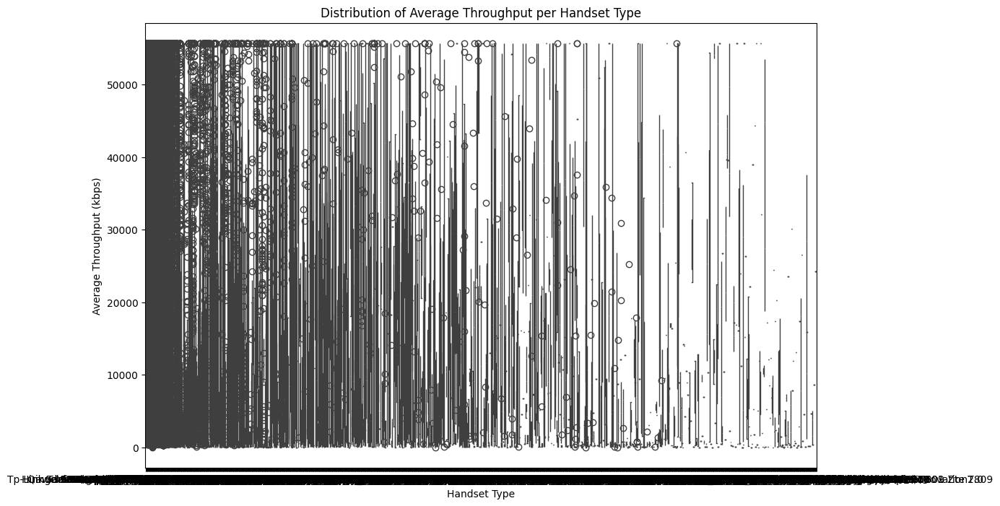

In [21]:
plot_utls.plot_distribution(exp_df, 'handset_type', 'total_avg_bearer_tp_kbps',
                  'Distribution of Average Throughput per Handset Type',
                  'Handset Type', 'Average Throughput (kbps)')


In [22]:
handset_type_df = exp_df.groupby('handset_type').agg(
    {'total_avg_bearer_tp_kbps': 'mean', 'total_tcp_dl_retrans_vol_bytes': 'mean'})
handset_type_df.head()

,total_avg_bearer_tp_kbps,total_tcp_dl_retrans_vol_bytes
handset_type,,
A-Link Telecom I. Cubot A5,23510.000,793127.0
A-Link Telecom I. Cubot Note Plus,6699.000,616213.0
A-Link Telecom I. Cubot Note S,8937.000,11318546.0
A-Link Telecom I. Cubot Nova,55738.125,137170.0
A-Link Telecom I. Cubot Power,55738.125,8041.0


In [23]:
sorted_by_tp = handset_type_df.sort_values(
    'total_avg_bearer_tp_kbps', ascending=False)
top_tp = sorted_by_tp['total_avg_bearer_tp_kbps']
plot_utls.hist(top_tp.head(20))

#### The average TCP retransmission view per handset type

In [24]:
sorted_by_tcp = handset_type_df.sort_values(
    'total_tcp_dl_retrans_vol_bytes', ascending=False)
top_tcp = sorted_by_tcp['total_tcp_dl_retrans_vol_bytes']
top_tcp.head()

handset_type
unknown                                        11318546.0
Lg-M400Dy                                      11318546.0
Huawei Maimang 6                               11318546.0
Kvd Internationa. Doogee S55                   11318546.0
Sony Mobile Comm. Xperia X Performance Dual    11318546.0
Name: total_tcp_dl_retrans_vol_bytes, dtype: float64

In [25]:
plot_utls.hist(top_tcp.head(20))

#### k-means clustering (where k = 3) to segment users into groups of experiences

In [26]:
exp_metric_df = exp_df[[
  'total_avg_bearer_tp_kbps', 'total_avg_rtt_dl_ms', 'total_tcp_dl_retrans_vol_bytes']].copy()
exp_metric_df.head()

,total_avg_bearer_tp_kbps,total_avg_rtt_dl_ms,total_tcp_dl_retrans_vol_bytes
9,6380.0,194.0,3238627.0
10,15.0,194.0,3238627.0
11,34805.0,242.0,6034635.0
12,115.0,242.0,6034635.0
13,2.0,242.0,6034635.0


#### Check for outliers

<Axes: >

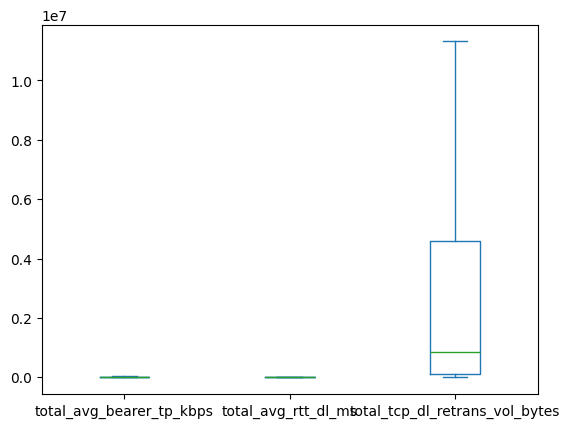

In [27]:
exp_metric_df.plot.box()

#### Scale the variables

In [28]:
scaler = StandardScaler()
scaled_array = scaler.fit_transform(exp_metric_df)
scaled_array
pd.DataFrame(scaled_array).head(5)

,0,1,2
0,-0.322642,1.362344,0.048987
1,-0.650382,1.362344,0.048987
2,1.140991,2.128745,0.738294
3,-0.645233,2.128745,0.738294
4,-0.651052,2.128745,0.738294


#### Normalize the dataset

In [29]:
data_normalized = normalize(scaled_array)
pd.DataFrame(data_normalized).head(5)

,0,1,2
0,-0.230313,0.972488,0.034969
1,-0.430596,0.901962,0.032433
2,0.451776,0.842878,0.292328
3,-0.275305,0.908281,0.315011
4,-0.277597,0.907659,0.314795


In [30]:
kmeans = KMeans(n_clusters=3, random_state=0).fit(data_normalized)
kmeans.labels_

/home/babi/anaconda3/envs/tenx_week1/lib/python3.12/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



array([0, 0, 0, ..., 2, 2, 2], dtype=int32)

In [32]:
exp_metric_df.insert(0, 'cluster', kmeans.labels_)
exp_metric_df

,cluster,total_avg_bearer_tp_kbps,total_avg_rtt_dl_ms,total_tcp_dl_retrans_vol_bytes
9,0,6380.000000,194.0,3238627.0
10,0,15.000000,194.0,3238627.0
11,0,34805.000000,242.0,6034635.0
12,0,115.000000,242.0,6034635.0
13,0,2.000000,242.0,6034635.0
...,...,...,...,...
150000,2,15070.474573,74.0,11318546.0
150001,2,15070.474573,74.0,11318546.0
150002,2,15070.474573,74.0,11318546.0
150003,2,15070.474573,74.0,11318546.0


In [33]:
exp_metric_df['cluster'].value_counts()

1    69617
0    53613
2    26766
Name: cluster, dtype: int64

In [34]:
plot_utls.plot_scatter_cluster(exp_metric_df,
                            x_column='total_avg_rtt_dl_ms',
                            y_column='total_avg_bearer_tp_kbps',
                            color_column='cluster',
                            size_column='total_tcp_dl_retrans_vol_bytes',
                            title='Scatter Plot of User Experience Metrics')


In [35]:
plot_utls.plot_3d_scatter(exp_metric_df,
                                  x_column='total_avg_rtt_dl_ms',
                                  y_column='total_avg_bearer_tp_kbps',
                                  z_column='total_tcp_dl_retrans_vol_bytes',
                                  color_column='cluster',
                                  rotation=[-1.5, -1.5, 1],
                                  title='3D Scatter Plot of User Experience Metrics')

#### Save the user experience dataframe

In [36]:
exp_metric_df.to_csv('../data/tellco_user_experience_data.csv')

#### Save the mode as pickle

In [ ]:
with open("../models/tellco_user_experience.pkl", "wb") as f:
    pickle.dump(kmeans, f)